In [1]:
import pandas as pd
import numpy as np
import os
import sys
import scanpy as sc
import anndata as ad
import scipy
import gget

import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable

# local 
import utils as ut

In [2]:
# load predictions
fpath = "/nfs/turbo/umms-indikar/shared/projects/MC3R/hypomap/merged_predictions.csv"
df = pd.read_csv(fpath)
print(f"{df.shape=}")

for c in df.columns:
    if not c == 'index':
        df[f'{c}_clean'] = df[c].apply(lambda x: x.split(":")[1]).astype(str)


# load clustering results
fpath = "/nfs/turbo/umms-indikar/shared/projects/MC3R/results/embedding.csv"
cdf = pd.read_csv(fpath)
print(f"{cdf.shape=}")

# merge 'em'
df = pd.merge(df, cdf, 
              how='left',
              left_on='index',
              right_on='index')

# clean-up the cell type
df = df.set_index('index')

print(f"{df.shape=}")
df.head()

df.shape=(43312, 5)
cdf.shape=(43312, 3)
df.shape=(43312, 10)


,reference_embedding_C7_named,reference_embedding_C25_named,C25_named,C7_named,reference_embedding_C7_named_clean,reference_embedding_C25_named_clean,C25_named_clean,C7_named_clean,UMAP1,UMAP2
index,,,,,,,,,,
AAACCCACATGGCTGC-1_fasted_m,C7-2: GABA,C25-11: GABA-1,C25-10: GABA-2,C7-2: GABA,GABA,GABA-1,GABA-2,GABA,-6.741960,14.083050
AAACCCAGTATATGGA-1_fasted_m,C7-2: GABA,C25-13: GABA-4,C25-1: GLU-1,C7-2: GABA,GABA,GABA-4,GLU-1,GABA,2.378481,2.956433
AAACCCAGTCAACACT-1_fasted_m,C7-5: Immune,C25-21: Immune,C25-21: Immune,C7-5: Immune,Immune,Immune,Immune,Immune,1.525248,-6.143299
AAACCCATCCCGTGAG-1_fasted_m,C7-4: Oligo+Precursor,C25-19: Oligodendrocytes,C25-19: Oligodendrocytes,C7-4: Oligo+Precursor,Oligo+Precursor,Oligodendrocytes,Oligodendrocytes,Oligo+Precursor,15.965842,14.408034
AAACCCATCGAACTCA-1_fasted_m,C7-1: GLU,C25-2: GLU-2,C25-2: GLU-2,C7-1: GLU,GLU,GLU-2,GLU-2,GLU,-2.045243,7.478702


In [3]:
dirpath = "/nfs/turbo/umms-indikar/shared/projects/MC3R/h5ad_files/"

data = {}

for f in os.listdir(dirpath):
    fullpath = f"{dirpath}{f}"
    key = f.replace(".h5ad", "")

    batch_andata = sc.read(fullpath)
    batch_andata.obs['batch'] = key
    data[key] = batch_andata
    
adata = ad.concat(data, index_unique="_") # combine all the experiments
adata.var_names_make_unique()
adata

AnnData object with n_obs × n_vars = 43312 × 32285
    obs: 'batch'

In [4]:
# add the metadata into the object
adata.obs = adata.obs.join(df, how='left')
adata.obs.head()

adata.obsm['X_umap'] = adata.obs[['UMAP1', 'UMAP2']].copy().to_numpy()

In [5]:
"""some simple processing """

adata.layers["counts"] = adata.X.copy() # store the raw counts

""" Add a metadata column """
adata.obs['broad_type'] = adata.obs['reference_embedding_C25_named_clean'].apply(lambda x: x.split("-")[0])

sc.pp.filter_cells(adata, min_genes=500)
sc.pp.filter_genes(adata, min_cells=10)
sc.pp.calculate_qc_metrics(adata)

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
# sc.pp.combat(adata) # regress out batch effects

sc.pp.highly_variable_genes(adata, 
                            min_mean=0.0125, 
                            max_mean=3, 
                            min_disp=0.5)

adata

AnnData object with n_obs × n_vars = 42937 × 25060
    obs: 'batch', 'reference_embedding_C7_named', 'reference_embedding_C25_named', 'C25_named', 'C7_named', 'reference_embedding_C7_named_clean', 'reference_embedding_C25_named_clean', 'C25_named_clean', 'C7_named_clean', 'UMAP1', 'UMAP2', 'broad_type', 'n_genes'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    obsm: 'X_umap'
    layers: 'counts'

Index(['batch', 'reference_embedding_C7_named',
       'reference_embedding_C25_named', 'C25_named', 'C7_named',
       'reference_embedding_C7_named_clean',
       'reference_embedding_C25_named_clean', 'C25_named_clean',
       'C7_named_clean', 'UMAP1', 'UMAP2', 'broad_type', 'n_genes'],
      dtype='object')


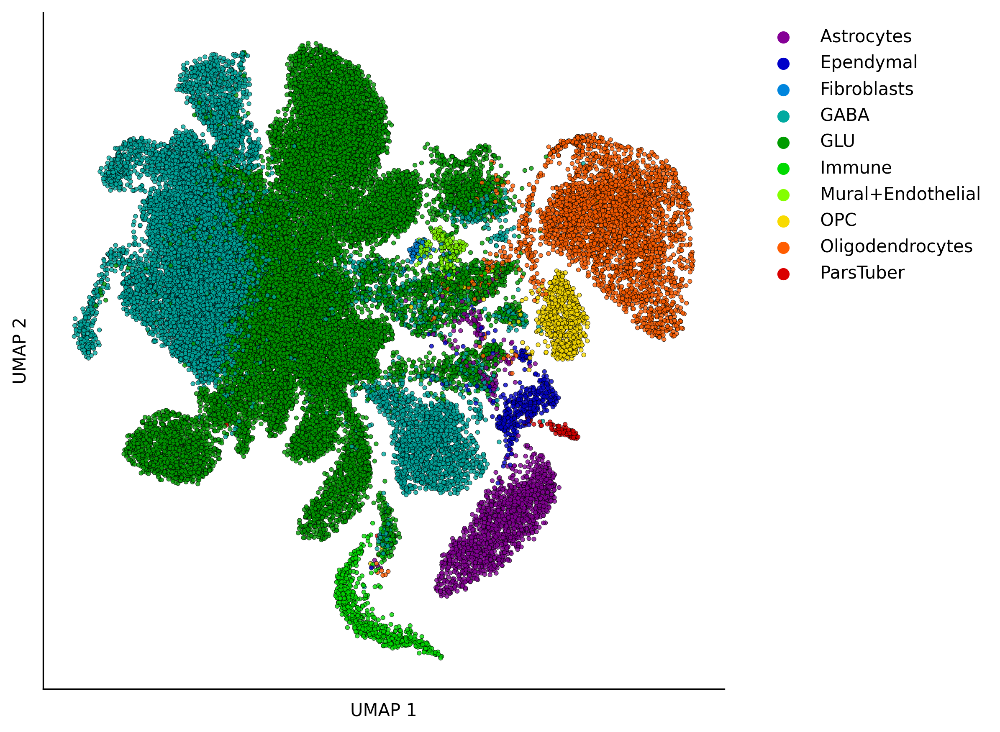

In [6]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 7, 7

print(adata.obs.columns)

key = 'broad_type'
cmap = 'Spectral'

colors = ut.ncolor(len(adata.obs[key].unique()) , cmap=cmap)
color_map = dict(zip(sorted(adata.obs[key].unique()), colors))
adata.obs['color'] = adata.obs[key].map(color_map)

sns.scatterplot(data=adata.obs,
                x='UMAP1',
                y='UMAP2',
                # c=adata.obs['color'].to_list(),
                hue=key,
                hue_order=sorted(adata.obs[key].unique()),
                palette='nipy_spectral',
                ec='k',
                linewidth=0.25,
                alpha=0.8,
                s=6)

plt.ylabel("UMAP 2")
plt.xlabel("UMAP 1")

plt.yticks([])
plt.xticks([])

sns.move_legend(plt.gca(),
                title='',
                frameon=False,
                loc='upper right',
                bbox_to_anchor=(1.4, 1))
sns.despine()

In [7]:
# break

,index,broad_type
3,Astrocytes,1674
6,Ependymal,439
9,Fibroblasts,89
1,GABA,13693
0,GLU,22020
5,Immune,648
7,Mural+Endothelial,199
4,OPC,699
2,Oligodendrocytes,3383
8,ParsTuber,93


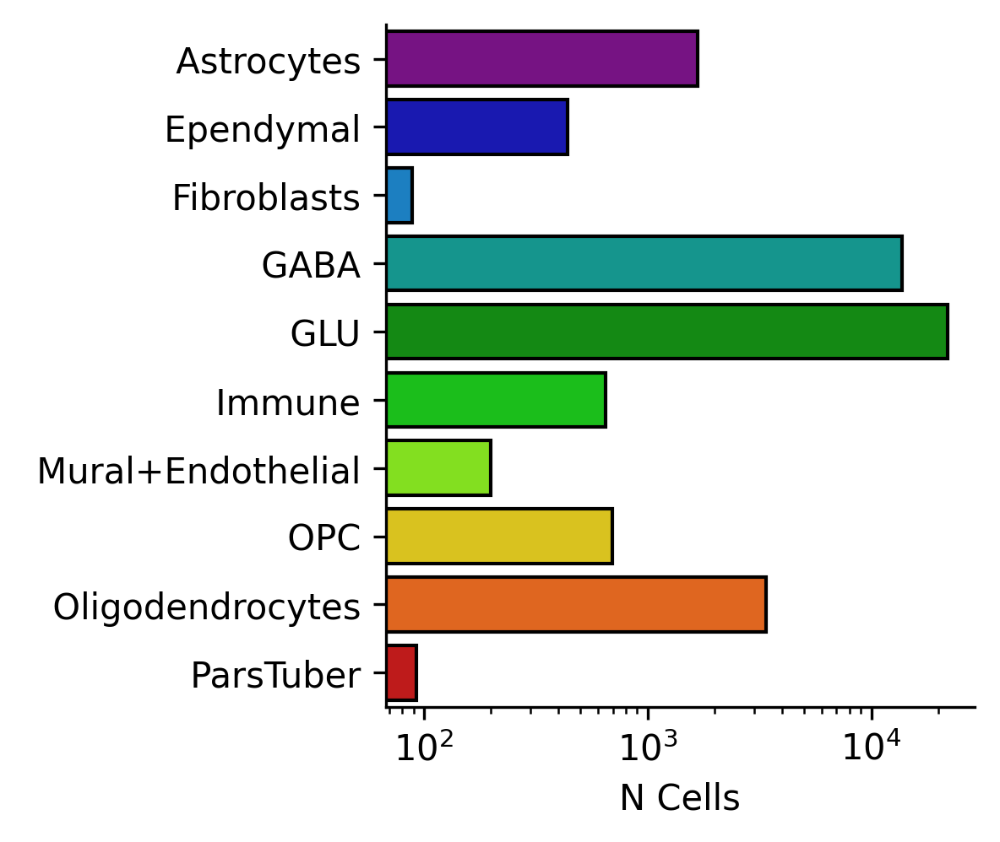

In [8]:
pdf = adata.obs[key].value_counts()
pdf = pdf.reset_index(drop=False)
pdf = pdf.sort_values(by='index', ascending=True)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3.5

sns.barplot(data=pdf, 
           x=key,
           y='index',
           edgecolor='k',
           palette='nipy_spectral',)

sns.despine()
plt.ylabel("")
plt.xscale("log")
plt.xlabel('N Cells')

pdf

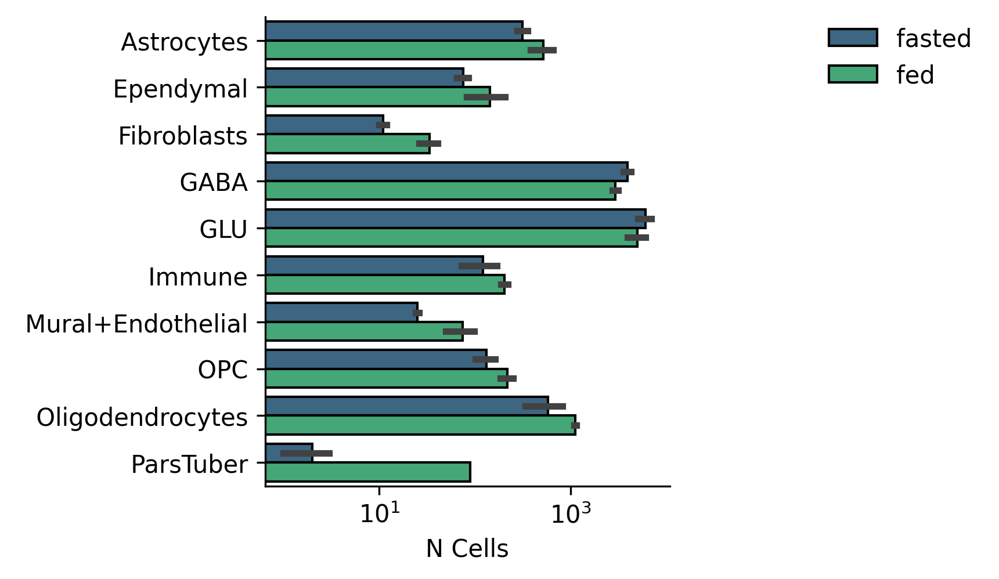

In [9]:
pdf = pd.DataFrame(adata.obs[['batch', key]].value_counts(), columns=['count'])
pdf = pdf.reset_index(drop=False)
pdf = pdf.sort_values(by=key, ascending=True)
pdf['Diet'] = pdf['batch'].apply(lambda x: x.split("_")[0])
pdf['Sex'] = pdf['batch'].apply(lambda x: x.split("_")[1])

pdf['batch_count'] = pdf.groupby('batch')['count'].transform('sum')
pdf['normed_count'] = pdf['count']  / pdf['batch_count']

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3.5

sns.barplot(data=pdf, 
           x='count',
           y=key,
           edgecolor='k',
           hue='Diet',
           palette='viridis',)

sns.despine()
plt.ylabel("")
plt.xscale("log")
plt.xlabel('N Cells')

sns.move_legend(plt.gca(),
                title='',
                frameon=False,
                loc='upper right',
                bbox_to_anchor=(1.8, 1.025))

# pdf

... storing 'batch' as categorical
... storing 'reference_embedding_C7_named' as categorical
... storing 'reference_embedding_C25_named' as categorical
... storing 'C25_named' as categorical
... storing 'C7_named' as categorical
... storing 'reference_embedding_C7_named_clean' as categorical
... storing 'reference_embedding_C25_named_clean' as categorical
... storing 'C25_named_clean' as categorical
... storing 'C7_named_clean' as categorical
... storing 'broad_type' as categorical
... storing 'color' as categorical


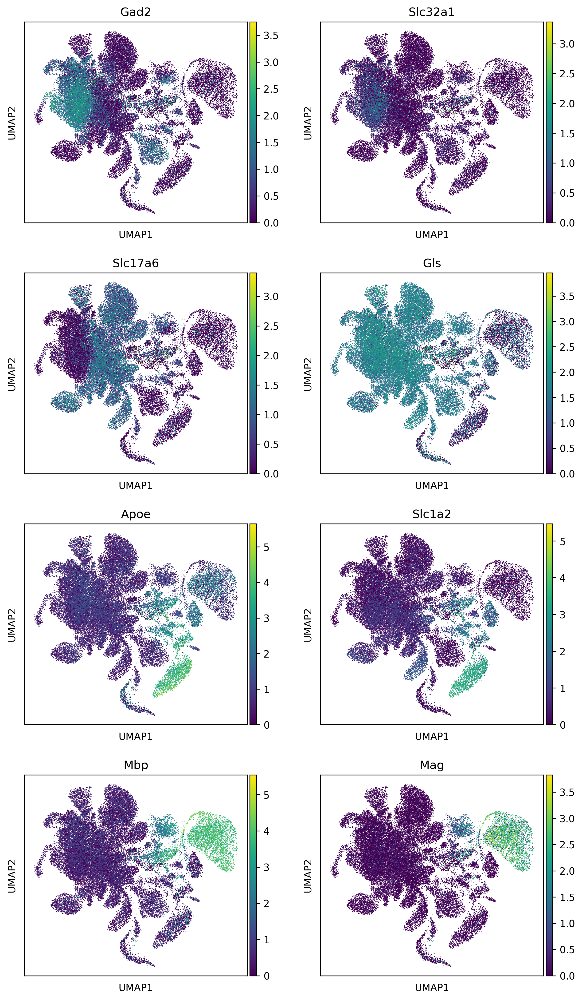

In [10]:
genes = ['GAD2', 'SLC32A1', 'SLC17A6', 'GLS', 'APOE', 'SLC1A2', 'MBP', 'MAG']
genes = [x.lower().capitalize() for x in genes]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.umap(adata, 
           color=genes,
           ncols=2)


In [11]:
""" MARKER GENE ANALYSIS """
n_genes_per_group = 20
fpath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/panglaodb/pandb.tsv.gz"
ct = pd.read_csv(fpath, sep='\t')
ct = ct[ct['organ'] == 'Brain']

short_list = [
    'Astrocytes',
    'GABAergic neurons',
    'Glutaminergic neurons',
    'Glycinergic neurons',
    'Microglia',
    'Neurons',
    'Oligodendrocytes',
    'Tanycytes',
]

ct = ct[ct['cell type'].isin(short_list)]
ct = ct.sort_values(by=['cell type', 'ubiquitousness index', 'specificity_mouse'],
                    ascending=[True, True, False])

ct = ct.groupby('cell type').head(n_genes_per_group)
ct = ct[['cell type', 'official gene symbol', 'ubiquitousness index']]
ct['gene'] = ct['official gene symbol'].apply(lambda x: x.lower().capitalize())
print(f"{ct.shape=}")

query = ct['gene'].to_list()
query = [x for x in query if x in adata.var_names]
print(f"{len(query)=}")

print(query)

ct.shape=(127, 4)
len(query)=120
['Aanat', 'Srr', 'Slit1', 'Nfatc3', 'Il23a', 'Dio2', 'Wnt3', 'Slc1a6', 'Snph', 'Hspb6', 'Lcat', 'Slc7a10', 'Plxnb1', 'Slc39a12', 'Slc25a28', 'Hmg20a', 'Aldh1l1', 'Itih3', 'Entpd2', 'Cd40', 'Mybpc1', 'Tnfaip8l3', 'Pax2', 'Vip', 'Pvalb', 'Parm1', 'Gabbr2', 'Slc32a1', 'Sst', 'Gad1', 'Dlx1', 'Sema3c', 'Slc6a1', 'Gad2', 'Gadd45b', 'Slc17a8', 'Slc1a6', 'Slc17a7', 'Slc1a1', 'Grin1', 'Slc17a6', 'Gls', 'Slc1a2', 'Grin2b', 'Meis2', 'Slc6a9', 'Slc32a1', 'P2rx7', 'Sall1', 'Itgax', 'Zeb2os', 'P2ry13', 'Clec10a', 'Aldh1a2', 'Il10ra', 'Lag3', 'Tcirg1', 'Mrc2', 'Cd40', 'Cd180', 'Csf3r', 'Slc2a5', 'Tmem173', 'Il21r', 'Tbxas1', 'Ucp2', 'Epo', 'Rin1', 'Ghsr', 'Omp', 'Cxcr5', 'Agrp', 'Chat', 'Aim2', 'Th', 'B3gat2', 'Nwd2', 'Chodl', 'Avp', 'Necab3', 'Zrsr1', 'Sacs', 'Tac2', 'Cpne6', 'Cntf', 'Slc25a29', 'Kif6', 'Arrdc2', 'Sgk2', 'Sec14l5', 'Sp7', 'Kif13b', 'Eml1', 'Galc', 'Nipal4', 'Plekhh1', 'Ninj2', 'Nfe2l3', 'Cldn14', 'Klk6', 'Npc1', 'Gpr62', 'Drd2', 'Gpr50', 'Fndc3c1', '

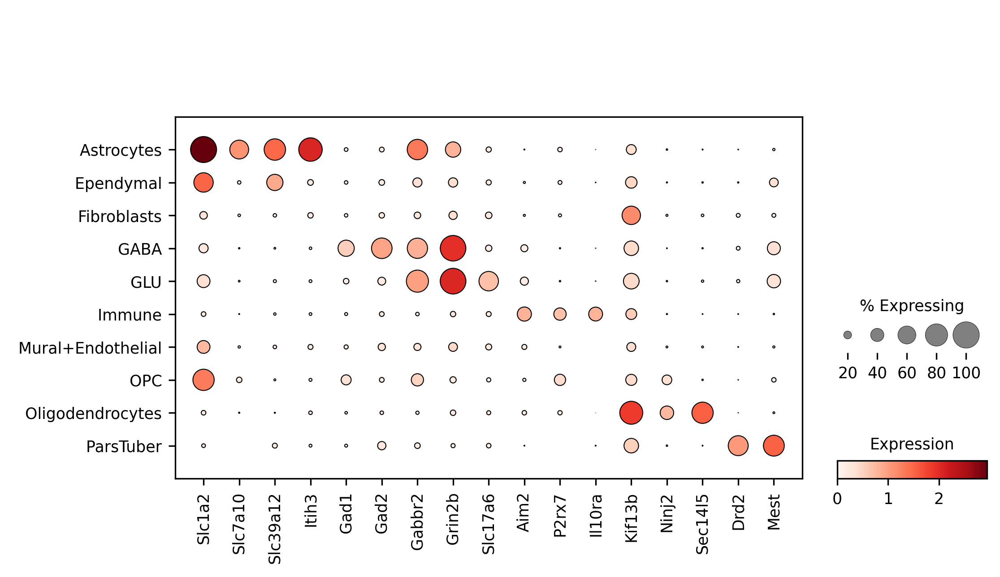

In [12]:

q = [
    'Slc1a2',
    'Slc7a10',
    'Slc39a12',
    'Itih3',
    'Gad1',
    'Gad2',
    'Gabbr2',
    'Grin2b',
    'Slc17a6',
    'Aim2',
    'P2rx7',
    'Il10ra',
    'Kif13b',
    'Ninj2',
    'Sec14l5', 
    'Drd2', 
    'Mest',
]

sc.pl.dotplot(adata, 
              q, 
              groupby=key,
              lw=0.5,
              size_title='% Expressing',
              colorbar_title='Expression')


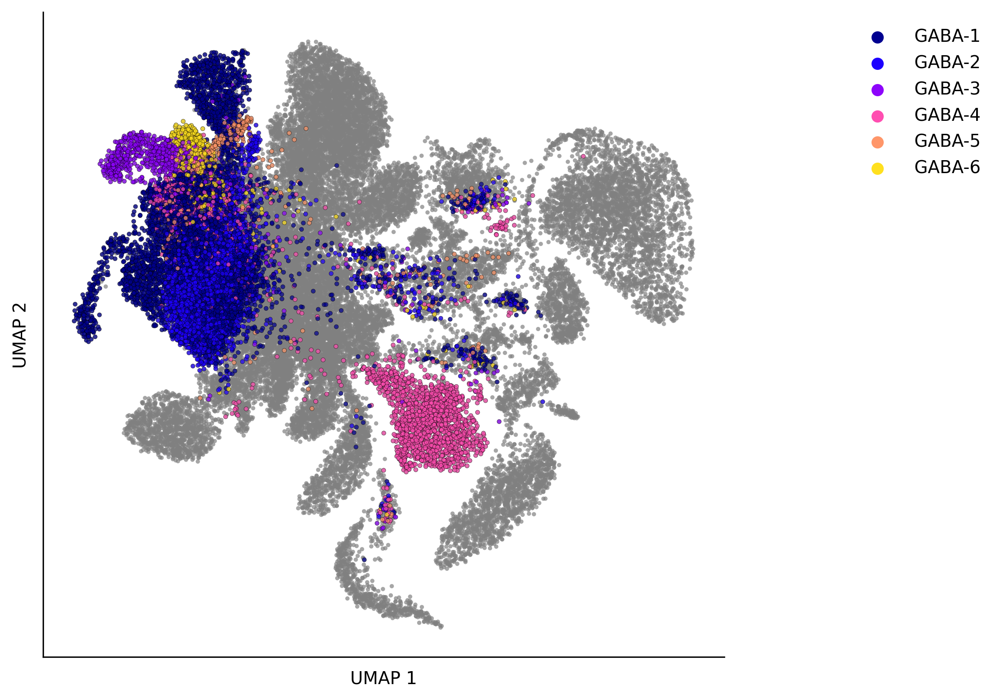

In [13]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 7, 7

# btypes = [' GLU']
btypes = [' GABA']
mask = (adata.obs['broad_type'].isin(btypes))

subs = adata.obs[mask].reset_index()

subs['reference_embedding_C25_named_clean'] = subs['reference_embedding_C25_named_clean'].astype(str)

sns.scatterplot(data=adata.obs,
                x='UMAP1',
                y='UMAP2',
                c='grey',
                ec='none',
                zorder=0,
                alpha=0.7,
                s=6)

sns.scatterplot(data=subs,
                x='UMAP1',
                y='UMAP2',
                hue='reference_embedding_C25_named_clean',
                hue_order=sorted(subs['reference_embedding_C25_named_clean'].unique()),
                palette='gnuplot2',
                ec='k',
                zorder=2,
                alpha=0.7,
                s=6)

plt.ylabel("UMAP 2")
plt.xlabel("UMAP 1")

plt.yticks([])
plt.xticks([])
plt.gca().set_aspect('equal')

sns.move_legend(plt.gca(),
                title='',
                frameon=False,
                loc='upper right',
                bbox_to_anchor=(1.4, 1))
sns.despine()

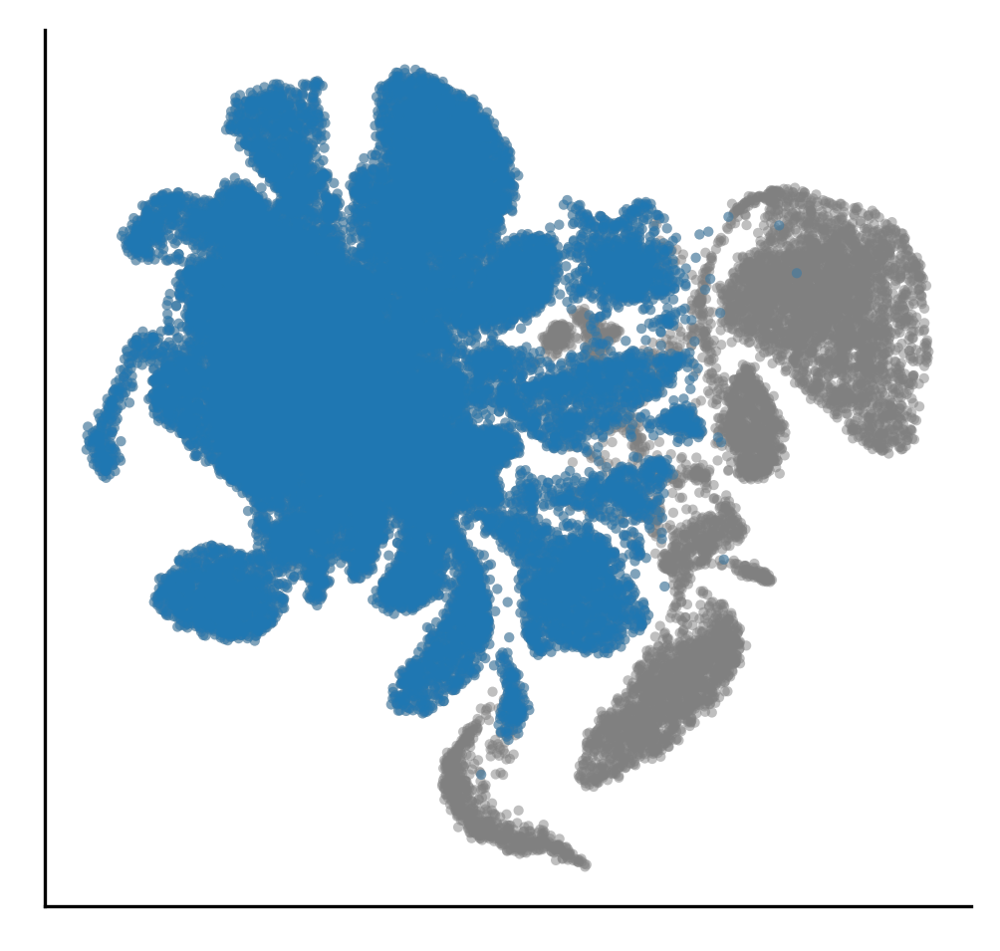

In [34]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

# ctypes = [' GLU', ' GABA']
ctypes = [' GLU', ' GABA']
mask = (adata.obs['broad_type'].isin(ctypes))
gene_pos = adata.obs[mask]
counts = gene_pos['broad_type'].value_counts().reset_index()

sns.scatterplot(data=adata.obs,
                x='UMAP1',
                y='UMAP2',
                c='grey',
                ec='none',
                zorder=0,
                alpha=0.5,
                s=6)



sns.scatterplot(data=adata.obs[mask],
                x='UMAP1',
                y='UMAP2',
                c='C0',
                # c=c,
                # cmap='viridis',
                ec='none',
                zorder=2,
                alpha=0.4,
                s=6)

plt.ylabel("")
plt.xlabel("")

plt.yticks([])
plt.xticks([])
plt.gca().set_aspect('equal')

sns.despine()

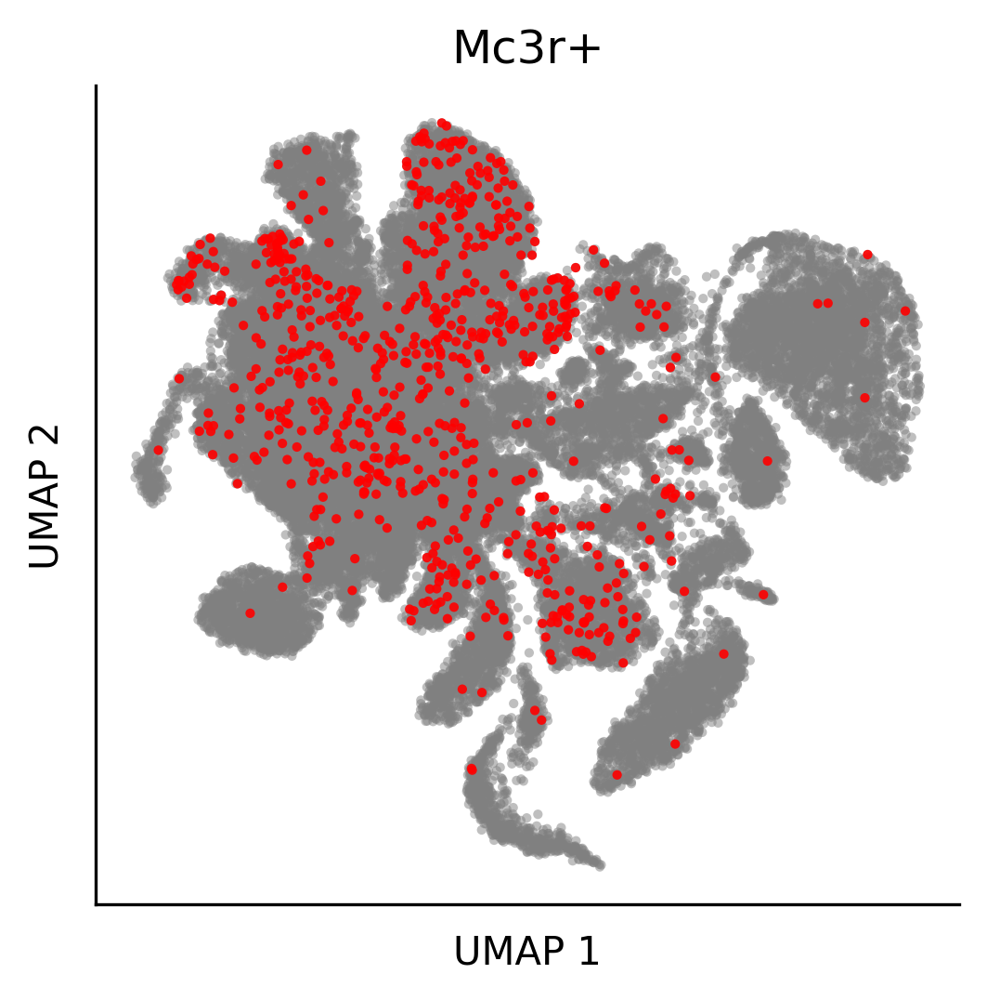

In [19]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

gene = 'Mc3r'
mask = (adata[:, [gene]].layers['counts'].todense() > 0)
gene_pos = adata.obs[mask]
counts = gene_pos['broad_type'].value_counts().reset_index()

sns.scatterplot(data=adata.obs,
                x='UMAP1',
                y='UMAP2',
                c='grey',
                ec='none',
                zorder=0,
                alpha=0.5,
                s=6)

c = np.log1p(list(adata[mask][:, gene].X.todense()))

sns.scatterplot(data=adata.obs[mask],
                x='UMAP1',
                y='UMAP2',
                c='r',
                # c=c,
                # cmap='viridis',
                ec='none',
                zorder=2,
                alpha=0.6,
                s=6)

plt.ylabel("UMAP 2")
plt.xlabel("UMAP 1")

gene_str = f"{gene}+"
plt.title(gene_str)
plt.yticks([])
plt.xticks([])
plt.gca().set_aspect('equal')

sns.despine()

gene_pos.shape=(21714, 14)


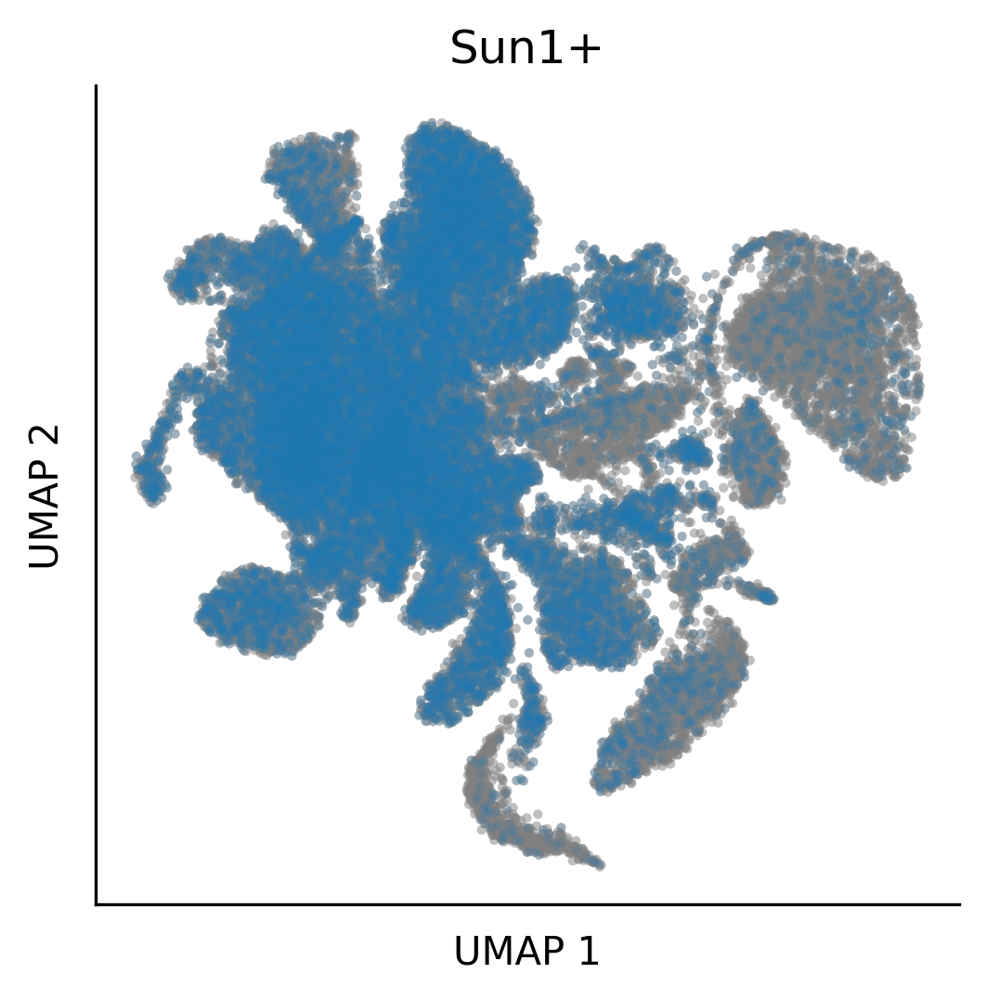

In [23]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

gene = 'Sun1'
mask = (adata[:, [gene]].layers['counts'].todense() > 0)

gene_pos = adata.obs[mask]
counts = gene_pos['broad_type'].value_counts().reset_index()
print(f"{gene_pos.shape=}")

sns.scatterplot(data=adata.obs,
                x='UMAP1',
                y='UMAP2',
                c='grey',
                ec='none',
                zorder=0,
                alpha=0.5,
                s=6)

c = np.log1p(list(adata[mask][:, gene].X.todense()))

sns.scatterplot(data=adata.obs[mask],
                x='UMAP1',
                y='UMAP2',
                c='C0',
                # c=c,
                # cmap='viridis',
                ec='none',
                zorder=2,
                alpha=0.2,
                s=6)

plt.ylabel("UMAP 2")
plt.xlabel("UMAP 1")

gene_str = f"{gene}+"
plt.title(gene_str)
plt.yticks([])
plt.xticks([])
plt.gca().set_aspect('equal')

sns.despine()

gene_pos.shape=(502, 14)


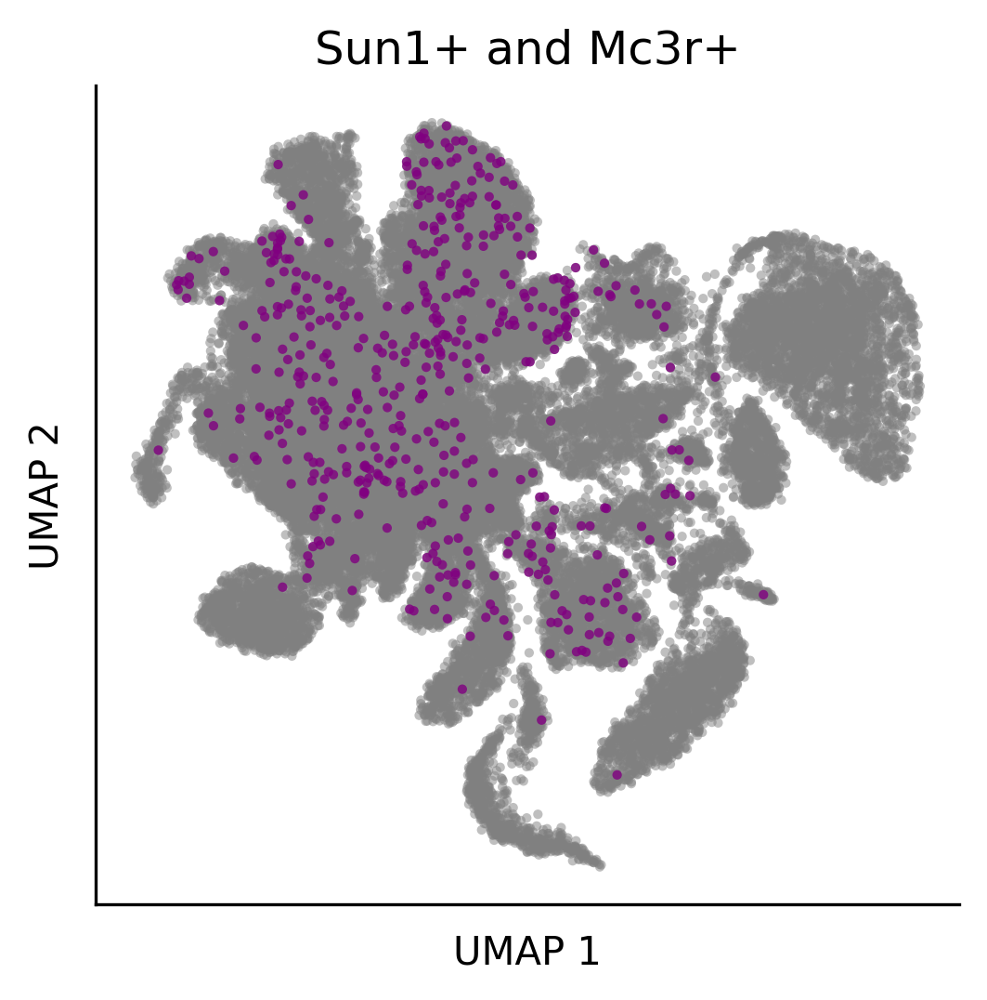

In [28]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

mask = (adata[:, ['Sun1']].layers['counts'].todense() > 0) & (adata[:, ['Mc3r']].layers['counts'].todense() > 0)

gene_pos = adata.obs[mask]
counts = gene_pos['broad_type'].value_counts().reset_index()
print(f"{gene_pos.shape=}")

sns.scatterplot(data=adata.obs,
                x='UMAP1',
                y='UMAP2',
                c='grey',
                ec='none',
                zorder=0,
                alpha=0.5,
                s=6)

# c = np.log1p(list(adata[mask][:, gene].X.todense()))

sns.scatterplot(data=adata.obs[mask],
                x='UMAP1',
                y='UMAP2',
                c='Purple',
                # c=c,
                # cmap='viridis',
                ec='none',
                zorder=2,
                alpha=0.8,
                s=6)

plt.ylabel("UMAP 2")
plt.xlabel("UMAP 1")

gene_str = f"Sun1+ and Mc3r+"
plt.title(gene_str)
plt.yticks([])
plt.xticks([])
plt.gca().set_aspect('equal')

sns.despine()

In [15]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

In [ ]:
# ut.makeColorbar('viridis', 0.3, 2.5, 'Expression (log)', 'vertical', ['Low', 'High'])

In [ ]:
gene = 'Mc3r'
pdf = adata.obs.copy()

print(f"{pdf.shape}")
pdf[gene] = np.array(adata[:, [gene]].layers['counts'].todense())

mask = (pdf[gene] > 0)

counts = pdf[mask]['reference_embedding_C25_named_clean'].value_counts()
counts = counts.reset_index(drop=False)
counts = counts.sort_values(by='index')



plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 1.5, 8
plt.rcParams['figure.facecolor'] = 'none'

sns.barplot(data=counts, 
            y='index',
            x='reference_embedding_C25_named_clean',
            color='lightgrey',
            ec='k')


plt.xlabel("N Cells")
plt.ylabel("")
# plt.tick_params(axis='y', rotation=90)
sns.despine()
plt.gca().set_facecolor('None')
# plt.axis(False)

In [ ]:
gene = 'Mc3r'
pdf = adata.obs.copy()


ctypes = [
    ' GABA',
    ' GLU',
]


print(f"{pdf.shape}")
pdf[gene] = np.array(adata[:, [gene]].layers['counts'].todense())
pdf = pdf[pdf['broad_type'].isin(ctypes)]

mask = (pdf[gene] > 0)

pdf = pdf[mask].reset_index(drop=False)

pdf['Diet'] = pdf['batch'].apply(lambda x: x.split("_")[0])
pdf['Sex'] = pdf['batch'].apply(lambda x: x.split("_")[1])
print(f"{pdf.shape=}")

pdf.head()

counts = pdf[['broad_type', 'Diet', 'Sex']].value_counts()
counts = counts.reset_index(drop=False)
counts.columns = ['cell_type', 'diet', 'sex', 'count']
counts['cell_type'] = counts['cell_type'].astype(str)


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.5, 2
plt.rcParams['figure.facecolor'] = 'none'

sns.barplot(data=counts,
            x='cell_type',
            y='count',
            palette='viridis',
            hue='diet',
            ec='k')

sns.despine()
plt.xlabel("")
plt.ylabel("N cells")

sns.move_legend(plt.gca(),
                title="Diet",
                loc='upper right',
                frameon=False,
                bbox_to_anchor=(1.2, 1))

In [ ]:
[x for x in adata.var_names if 'glp' in x.lower()]

In [ ]:

pdf = adata.obs.copy()

ctypes = [
    ' GABA',
    ' GLU',
]

print(f"{pdf.shape}")

genes = [
    'Mc3r', 
    "Agrp", 
    "Npy", 
    "Nr5a1", 
    "Pomc", 
    "Mc4r", 
    "Gnrhr", 
    "Gnrh1", 
    "Ghrh", 
    "Ghrhr", 
    "Sst", 
    "Esr1",
    "Lepr",
    "Pnoc",
    "Adcyap1",
    "Foxp2", 
    "Dlk1",
    "Kiss1", 
    "Tac2", 
    "Pdyn", 
    "Rprm",
    "Oxtr",
    "Drd2",
    "Gria3", 
    "Grik1", 
    "Grik3", 
    "Gabra5", 
    "Gabra2", 
    "Syndig1",
    "Pak3",
    "Ptk2b", 
    "Plk2",
    "Trh",
    "Glp1r",
]

genes = list(set(genes))

exp = np.array(adata[:, genes].layers['counts'].todense())
exp = pd.DataFrame(exp, columns = genes, index=adata.obs.index)
pdf = pd.concat([pdf, exp], axis=1)

pdf = pdf[pdf['broad_type'].isin(ctypes)]


mask = (pdf['Mc3r'] > 0)

pdf = pdf[mask].reset_index(drop=False)
print(f"{pdf.shape=}")


pdf = pd.pivot_table(pdf, 
                     index='reference_embedding_C25_named_clean', 
                     values=genes,
                     aggfunc='mean')

pdf = pdf.drop(columns=['Mc3r'])
pdf = np.log1p(pdf)


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 8
plt.rcParams['figure.facecolor'] = 'none'

sns.heatmap(pdf.T,
            lw=0.25,
            linecolor='k',
            cbar=False,
            cmap='magma_r')

plt.ylabel("")
plt.xlabel("")

In [ ]:
ut.makeColorbar('magma_r', 0.2, 2.5, 'Expression (log)', 'vertical', ['Low', 'High'])

In [ ]:

pdf = adata.obs.copy()

ctypes = [
    ' GABA',
    ' GLU',
]

print(f"{pdf.shape}")

genes = [
    'Mc3r', 
    "Agrp", 
    "Npy", 
    "Nr5a1", 
    "Pomc", 
    "Mc4r", 
    "Gnrhr", 
    "Gnrh1", 
    "Ghrh", 
    "Ghrhr", 
    "Sst", 
    "Esr1",
    "Lepr",
    "Pnoc",
    "Adcyap1",
    "Foxp2", 
    "Dlk1",
    "Kiss1", 
    "Tac2", 
    "Pdyn", 
    "Rprm",
    "Oxtr",
    "Drd2",
    "Gria3", 
    "Grik1", 
    "Grik3", 
    "Gabra5", 
    "Gabra2", 
    "Syndig1",
    "Pak3",
    "Ptk2b", 
    "Plk2",
    "Trh",
    "Glp1r",
]

genes = list(set(genes))

exp = np.array(adata[:, genes].X.todense())
exp = pd.DataFrame(exp, columns = genes, index=adata.obs.index)
pdf = pd.concat([pdf, exp], axis=1)

pdf = pdf[pdf['broad_type'].isin(ctypes)]
pdf['Diet'] = pdf['batch'].apply(lambda x: x.split("_")[0])
pdf['Sex'] = pdf['batch'].apply(lambda x: x.split("_")[1])

mask = (pdf['Mc3r'] > 0)

pdf = pdf[mask].reset_index(drop=False)
print(f"{pdf.shape=}")

genes = [x for x in genes if not x == 'Mc3r']

pdf = pd.melt(pdf, 
              id_vars=['batch'],
              value_vars=genes)

pdf = pdf[pdf['value'] > 0] # remove non-expressed

pdf.head()

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 12, 3
# plt.rcParams['figure.facecolor'] = 'none'

sns.boxplot(data=pdf,
            x='variable',
            y='value',
            hue='batch',
            palette='tab20',
            showfliers=False)

plt.tick_params(axis='x', rotation=90)
plt.ylabel("Expression (log)")
plt.xlabel("")

sns.move_legend(plt.gca(),
                title="Batch",
                loc='upper right',
                frameon=False,
                bbox_to_anchor=(1.1, 1.1))

sns.despine()

In [ ]:

pdf = adata.obs.copy()
print(f"{pdf.shape}")

ctypes = [
    ' Astrocytes',
]

genes = [
    'Fos',
]

genes = list(set(genes))

exp = np.array(adata[:, genes].X.todense())
exp = pd.DataFrame(exp, columns = genes, index=adata.obs.index)
pdf = pd.concat([pdf, exp], axis=1)

pdf['Diet'] = pdf['batch'].apply(lambda x: x.split("_")[0])
pdf['Sex'] = pdf['batch'].apply(lambda x: x.split("_")[1])


pdf = pdf[pdf['broad_type'].isin(ctypes)]

print(f"{pdf.shape=}")


# genes = [x for x in genes if not x == 'Mc3r']

pdf = pd.melt(pdf, 
              id_vars=['Diet'],
              value_vars=genes)

pdf.head()

# pdf = pdf[pdf['value'] > 0] # remove non-expressed

# pdf.head()

# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['figure.figsize'] = 12, 3
# # plt.rcParams['figure.facecolor'] = 'none'

sns.boxplot(data=pdf,
            x='variable',
            y='value',
            hue='batch',
            palette='tab20',
            showfliers=False)

# plt.tick_params(axis='x', rotation=90)
# plt.ylabel("Expression (log)")
# plt.xlabel("")

# sns.move_legend(plt.gca(),
#                 title="Batch",
#                 loc='upper right',
#                 frameon=False,
#                 bbox_to_anchor=(1.1, 1.1))

# sns.despine()

In [ ]:
break

In [ ]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 7, 7

mask = (adata[:, ['Mc3r']].X.todense() > 0)

mc3r = adata.obs[mask]


mc3r.head()



# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['figure.figsize'] = 7, 7

# sns.barplot(data=counts,
#             y='broad_type',
#             x='index',
#             ec='k')

# plt.yscale('log')

# plt.ylabel("n Cells")
# plt.xlabel("")


In [ ]:
break

In [ ]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 7, 7

gene = 'Mc3r'
mask = (adata[:, [gene]].layers['counts'].todense() > 0)
sub = adata.obs[mask]
print(sub['broad_type'].value_counts())

sns.scatterplot(data=adata.obs,
                x='UMAP1',
                y='UMAP2',
                c='grey',
                ec='none',
                zorder=0,
                alpha=0.7,
                s=6)

c = list(adata[mask][:, gene].X.todense())
# print(c.shape)

sns.scatterplot(data=adata.obs[mask],
                x='UMAP1',
                y='UMAP2',
                c=c,
                ec='k',
                zorder=2,
                alpha=0.7,
                s=6)

# plt.ylabel("UMAP 2")
# plt.xlabel("UMAP 1")

# plt.yticks([])
# plt.xticks([])

# sns.despine()

In [ ]:
# [x for x in adata.var_names if "mc" in x.lower()]

In [ ]:
800 / 40000

In [ ]:
adata